#  Import packages

In [1]:
import numpy as np
import h5py
import glob
import re
import tensorflow as tf

import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy.stats import pearsonr

import sys
sys.path.append('./..')
from src.training_utils import data_load, extract_floats, split_dataset, predict_multi_by_name, plot_violin_and_statistics,cross_mean_err_calculator

from tensorflow import keras
from keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Conv2D,Flatten,Dropout,MaxPooling2D,BatchNormalization,AveragePooling2D,LeakyReLU,GlobalAveragePooling2D,ReLU

from cmcrameri import cm
import seaborn as sns
import pandas as pd

np.set_printoptions(precision=3, suppress=True)

2024-04-15 22:46:20.013183: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-15 22:46:20.126745: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-04-15 22:46:22.013569: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


# Set seed (optional)

In [2]:
fixed_seed = 216 #choose seed (comment out if not needed)

if 'fixed_seed' in locals():
    keras.utils.set_random_seed(fixed_seed)
    print("Running program with fixed seed:",fixed_seed)
else:
    print("Running program with random seed.")


Running program with fixed seed: 216


# Setup GPU

First, follow instructions [here](https://gist.github.com/zrruziev/b93e1292bf2ee39284f834ec7397ee9f), or alternatively run:
```bash
for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
```
We do this as a workaround for [this error](https://github.com/tensorflow/tensorflow/issues/42738):

In [3]:
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
for device in gpu_devices:
    tf.config.experimental.set_memory_growth(device, True)
print(tf.config.list_physical_devices('GPU'), tf.test.gpu_device_name())
print("TF Version:",tf.__version__)

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')] /device:GPU:0
TF Version: 2.16.1


2024-04-15 22:46:24.894395: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-15 22:46:25.097387: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-15 22:46:25.097511: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

# Define Functions

In [4]:
def violin_plotter (v,y_val,adjustment,legloc="upper left"):
    bins = np.logspace(-6,-1,10, base=2)*0.85

    #v = prediction2.T[0]

    colors = cm.batlowS(np.digitize(v, bins))
    colors_actual = cm.batlowS(np.digitize(np.unique(y_val),bins))

    fig, (ax1,ax2) = plt.subplots(nrows=2,ncols=1,figsize=(9,6),dpi=600)

    df = pd.DataFrame()
    df.insert(0, "predicted", v - y_val)
    df.insert(1, "actual", y_val)

    sns.violinplot(
        ax=ax1,
        data=df,
        x="actual",
        y="predicted",
        color="w",
        alpha=0.7,
        density_norm="width",
        linewidth=1,
        inner="box",
        inner_kws={"box_width": 4, "color": "0.2"},
        )

    ax1.set_xlabel("Actual turning rate")
    ax1.set_ylabel(r"Prediction Difference $P_{pred}-P_{true}$")

    std = []
    means = []
    overlap = []
    std_div = []
    accuracy = 5e-3
    print ("Prediction means and standard deviations.")
    for val in np.unique(y_val):
        v_mapped = v[np.where(y_val == val)]
        stdev = np.std(v_mapped)
        std.append(stdev)
        mean = np.mean(v_mapped)
        overlap.append((val + accuracy >= np.min(v_mapped)) & (val - accuracy <= np.max(v_mapped)))
        within_std = abs(val-mean)/stdev
        print (f"Actual value {val}: Average = {mean:.5f} +- {stdev:.5f}; Expected value within {within_std:.3f} stdevs of mean")
        std_div.append(within_std)

    print(f"With accuracy {accuracy}, overlap ratio:", np.sum(overlap)/len(overlap))
    print("(Min, Max, Avg) STD:", np.min(std), np.max(std), np.mean(std))
    print("Pearson's correlation coeff: ", pearsonr(y_val, v).statistic)



    for val in np.unique(y_val):
        v_mapped = v[np.where(y_val == val)]
        means.append(np.mean(v_mapped))

    ax2.errorbar(np.sort(np.unique(y_val)),np.abs(means-np.sort(np.unique(y_val))),yerr=(std),ecolor='black',elinewidth=0.5,capsize=3,color='purple',label=r'$|\langle P_{pred} \rangle -P_{true}|$')
    ax2.plot(np.sort(np.unique(y_val)),np.zeros(np.unique(y_val).shape[0]),color='red',label='True value line',linestyle='dotted',alpha=0.5)


    ax2.legend(loc=legloc)

    counter = 0
    for i in np.sort(np.unique(y_val)):
        ax2.text(i,adjustment,f"${std_div[counter]:.3f} \sigma$",ha="center")
        counter = counter + 1

    ax2.set_xscale("log")
    ax2.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
    ax2.set_xticks(np.unique(y_val))

    ax2.set_xlabel("Actual turning rate")
    ax2.set_ylabel("Absolute mean prediction difference")

    fig.tight_layout()

# Import and prepare data

set model1 to have orientation, model2 to be monochrome, model3 to be scrambled

In [5]:
#all alphas: [0.016,0.023,0.034,0.050,0.073,0.107,0.157,0.231,0.340,0.500]
#all densities: [0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,0.50,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95]
x1,y1,shape1 = data_load(alphas=[0.016,0.023,0.034,0.050,0.073,0.1067,0.157,0.231,0.340,0.500], densities=[0.25],orientation=True,scrambled=False)
x2,y2,shape2 = data_load(alphas=[0.016,0.023,0.034,0.050,0.073,0.1067,0.157,0.231,0.340,0.500], densities=[0.25],orientation=False,scrambled=False)
x3,y3,shape3 = data_load(alphas=[0.016,0.023,0.034,0.050,0.073,0.1067,0.157,0.231,0.340,0.500], densities=[0.25],orientation=False,scrambled=True)

We have N * number of unique alpha snapshots total, we split them into training set and a validation set with the ratio 80/20:

In [6]:
print("Orientation model:")
x_train1, y_train1, x_val1, y_val1 = split_dataset(x1,y1,last=int(len(x1)*1)) #len(x)*1 means no training, only validation!
x_train2, y_train2, x_val2, y_val2 = split_dataset(x2,y2,last=int(len(x1)*1)) #len(x)*1 means no training, only validation!
x_train3, y_train3, x_val3, y_val3 = split_dataset(x3,y3,last=int(len(x1)*1)) #len(x)*1 means no training, only validation!



Orientation model:
Number of unique alpha:  10
Shape of x:  (10000, 128, 128, 1)
Shape of y:  (10000,)
Size of training data:  0
Size of validation data:  10000
Number of unique alpha:  10
Shape of x:  (10000, 128, 128, 1)
Shape of y:  (10000,)
Size of training data:  0
Size of validation data:  10000
Number of unique alpha:  10
Shape of x:  (10000, 128, 128, 1)
Shape of y:  (10000,)
Size of training data:  0
Size of validation data:  10000


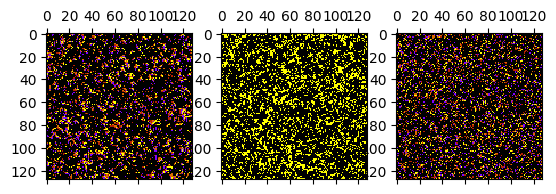

In [7]:
fig, (ax1,ax2,ax3) = plt.subplots(nrows=1,ncols=3)
ax1.matshow(x_val1[500],cmap=plt.get_cmap(name="gnuplot",lut=5))
ax2.matshow(x_val2[500],cmap=plt.get_cmap(name="gnuplot",lut=5))
ax3.matshow(x_val3[500],cmap=plt.get_cmap(name="gnuplot",lut=5))

# Predict multiple models

In [8]:
models_one = ['orientation0216','orientation0226','orientation0236','orientation0246','orientation0256','orientation0266','orientation0276','orientation0286','orientation0296','orientation0306'] #array of model names
models_two = ['monochrome0216','monochrome0226','monochrome0236','monochrome0246','monochrome0256','monochrome0266','monochrome0276','monochrome0286','monochrome0296','monochrome0306'] # array of model names
models_three = ['scrambled0216','scrambled0226','scrambled0236','scrambled0246','scrambled0256','scrambled0266','scrambled0276','scrambled0286','scrambled0296','scrambled0306'] # array of model names

one_pred_of_one, one_actuals_of_one = predict_multi_by_name(models_one,x_val1,y_val1)
one_pred_of_two, one_actuals_of_two = predict_multi_by_name(models_one,x_val2,y_val2)
one_pred_of_three, one_actuals_of_three = predict_multi_by_name(models_one,x_val3,y_val3)

two_pred_of_two, two_actuals_of_two = predict_multi_by_name(models_two,x_val2,y_val2)
two_pred_of_one, two_actuals_of_one = predict_multi_by_name(models_two,x_val1,y_val1)
two_pred_of_three, two_actuals_of_three = predict_multi_by_name(models_two,x_val3,y_val3)

three_pred_of_three, three_actuals_of_three = predict_multi_by_name(models_three,x_val3,y_val3)
three_pred_of_one, three_actuals_of_one = predict_multi_by_name(models_three,x_val1,y_val1)
three_pred_of_two, three_actuals_of_two = predict_multi_by_name(models_three,x_val2,y_val2)

2024-04-15 22:46:33.673278: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-15 22:46:33.673415: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-15 22:46:33.673470: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

# Plot one results

## Predict one on one

Prediction means and standard deviations.
Actual value 0.016: Average = 0.02456 +- 0.00642; Expected value within 1.332 stdevs of mean
Actual value 0.023: Average = 0.02843 +- 0.00667; Expected value within 0.814 stdevs of mean
Actual value 0.034: Average = 0.03458 +- 0.00918; Expected value within 0.063 stdevs of mean
Actual value 0.05: Average = 0.04871 +- 0.01061; Expected value within 0.122 stdevs of mean
Actual value 0.073: Average = 0.07470 +- 0.00977; Expected value within 0.174 stdevs of mean
Actual value 0.107: Average = 0.10643 +- 0.01089; Expected value within 0.053 stdevs of mean
Actual value 0.157: Average = 0.15763 +- 0.02257; Expected value within 0.028 stdevs of mean
Actual value 0.231: Average = 0.24722 +- 0.03908; Expected value within 0.415 stdevs of mean
Actual value 0.34: Average = 0.34435 +- 0.04488; Expected value within 0.097 stdevs of mean
Actual value 0.5: Average = 0.42931 +- 0.04386; Expected value within 1.612 stdevs of mean
With accuracy 0.005, overlap rat

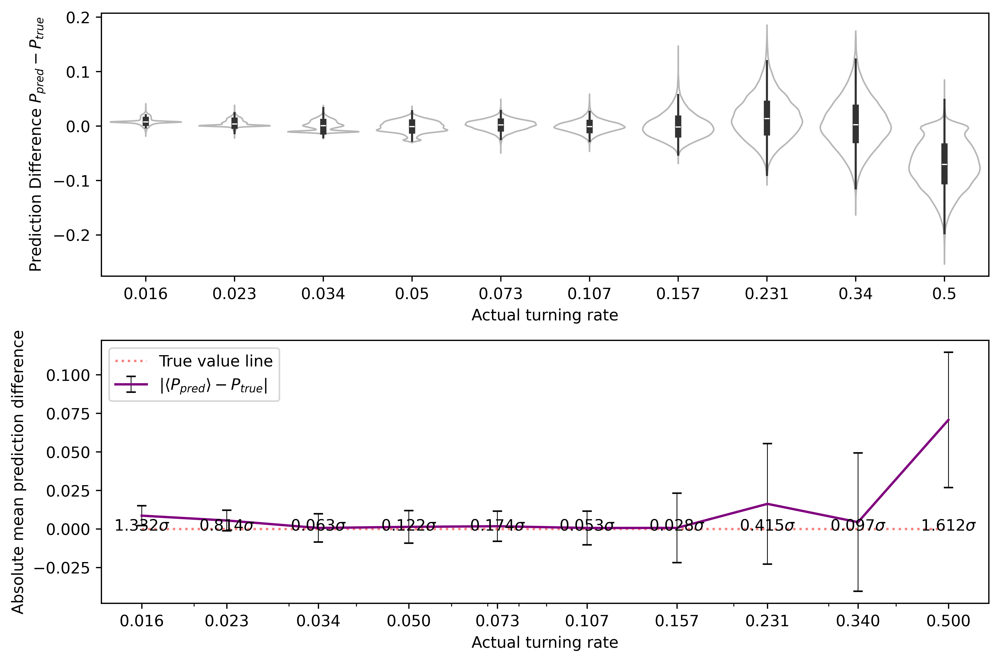

In [9]:
violin_plotter(one_pred_of_one,one_actuals_of_one,-0.001)

## Predict one on two

Prediction means and standard deviations.
Actual value 0.016: Average = 0.09348 +- 0.07892; Expected value within 0.982 stdevs of mean
Actual value 0.023: Average = 0.13953 +- 0.09727; Expected value within 1.198 stdevs of mean
Actual value 0.034: Average = 0.22812 +- 0.13519; Expected value within 1.436 stdevs of mean
Actual value 0.05: Average = 0.35233 +- 0.18960; Expected value within 1.595 stdevs of mean
Actual value 0.073: Average = 0.48409 +- 0.25911; Expected value within 1.587 stdevs of mean
Actual value 0.107: Average = 0.59604 +- 0.33456; Expected value within 1.462 stdevs of mean
Actual value 0.157: Average = 0.69448 +- 0.39884; Expected value within 1.348 stdevs of mean
Actual value 0.231: Average = 0.77328 +- 0.44618; Expected value within 1.215 stdevs of mean
Actual value 0.34: Average = 0.83519 +- 0.47979; Expected value within 1.032 stdevs of mean
Actual value 0.5: Average = 0.88966 +- 0.50315; Expected value within 0.774 stdevs of mean
With accuracy 0.005, overlap rat

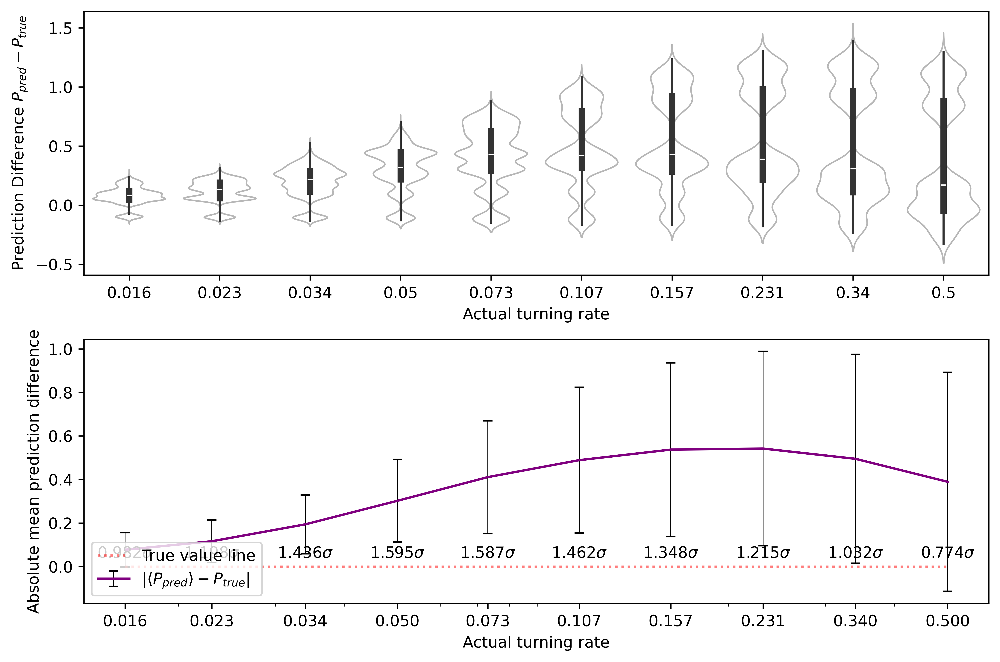

In [10]:
violin_plotter(one_pred_of_two,one_actuals_of_two,0.04,'lower left')

## Predict one on three

Prediction means and standard deviations.
Actual value 0.016: Average = 0.02989 +- 0.00943; Expected value within 1.473 stdevs of mean
Actual value 0.023: Average = 0.03307 +- 0.01004; Expected value within 1.003 stdevs of mean
Actual value 0.034: Average = 0.04103 +- 0.01240; Expected value within 0.567 stdevs of mean
Actual value 0.05: Average = 0.05760 +- 0.01554; Expected value within 0.489 stdevs of mean
Actual value 0.073: Average = 0.08545 +- 0.01486; Expected value within 0.838 stdevs of mean
Actual value 0.107: Average = 0.12253 +- 0.02118; Expected value within 0.733 stdevs of mean
Actual value 0.157: Average = 0.18762 +- 0.03896; Expected value within 0.786 stdevs of mean
Actual value 0.231: Average = 0.28089 +- 0.05267; Expected value within 0.947 stdevs of mean
Actual value 0.34: Average = 0.36835 +- 0.05265; Expected value within 0.538 stdevs of mean
Actual value 0.5: Average = 0.44215 +- 0.04406; Expected value within 1.313 stdevs of mean
With accuracy 0.005, overlap rat

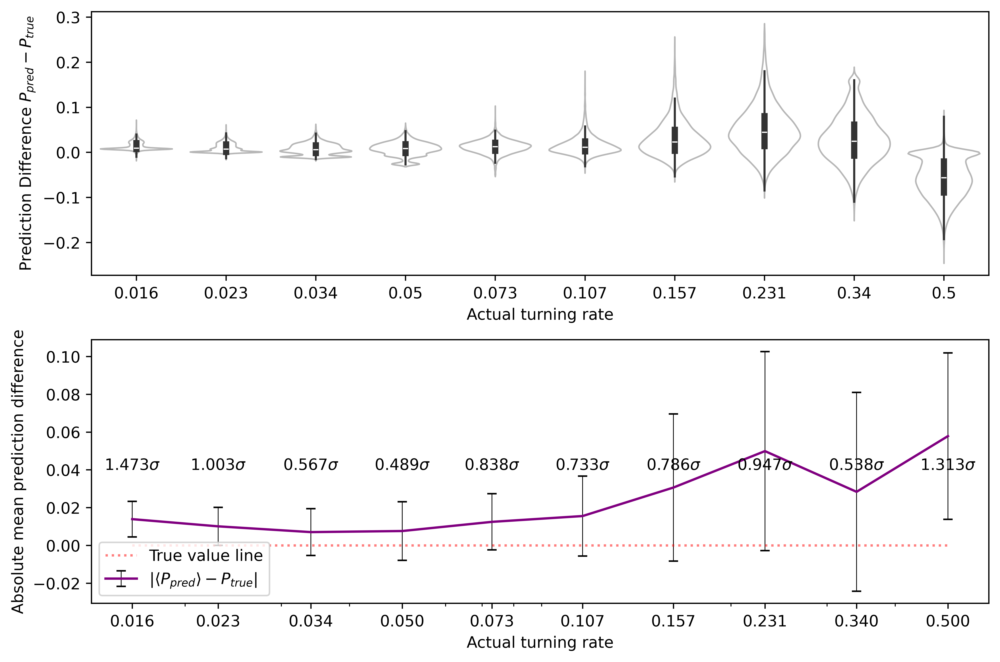

In [11]:
violin_plotter(one_pred_of_three,one_actuals_of_three,0.04,'lower left')

# Plot monochrome results

## Predict two on two

Prediction means and standard deviations.
Actual value 0.016: Average = 0.02350 +- 0.00620; Expected value within 1.211 stdevs of mean
Actual value 0.023: Average = 0.02798 +- 0.00663; Expected value within 0.750 stdevs of mean
Actual value 0.034: Average = 0.03459 +- 0.00969; Expected value within 0.061 stdevs of mean
Actual value 0.05: Average = 0.04984 +- 0.01070; Expected value within 0.015 stdevs of mean
Actual value 0.073: Average = 0.07462 +- 0.00934; Expected value within 0.173 stdevs of mean
Actual value 0.107: Average = 0.10662 +- 0.00982; Expected value within 0.039 stdevs of mean
Actual value 0.157: Average = 0.15530 +- 0.02019; Expected value within 0.084 stdevs of mean
Actual value 0.231: Average = 0.24482 +- 0.03617; Expected value within 0.382 stdevs of mean
Actual value 0.34: Average = 0.34497 +- 0.04245; Expected value within 0.117 stdevs of mean
Actual value 0.5: Average = 0.43545 +- 0.04208; Expected value within 1.534 stdevs of mean
With accuracy 0.005, overlap rat

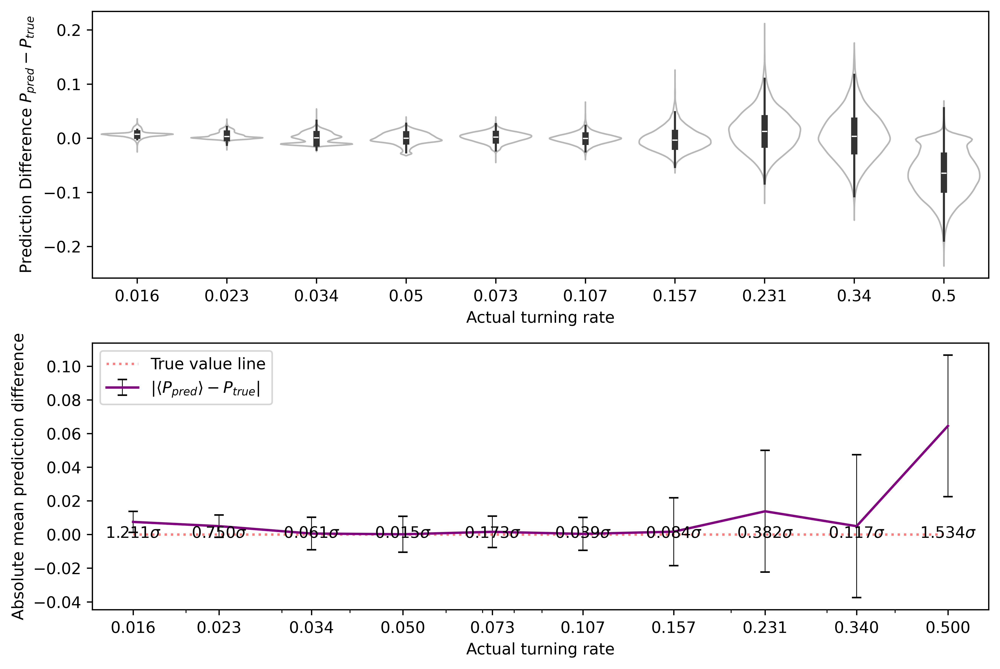

In [12]:
violin_plotter(two_pred_of_two,two_actuals_of_two,-0.002)

## Predict two on one

Prediction means and standard deviations.
Actual value 0.016: Average = 0.18009 +- 0.23467; Expected value within 0.699 stdevs of mean
Actual value 0.023: Average = 0.17961 +- 0.23419; Expected value within 0.669 stdevs of mean
Actual value 0.034: Average = 0.18227 +- 0.23712; Expected value within 0.625 stdevs of mean
Actual value 0.05: Average = 0.18925 +- 0.24394; Expected value within 0.571 stdevs of mean
Actual value 0.073: Average = 0.19958 +- 0.25440; Expected value within 0.498 stdevs of mean
Actual value 0.107: Average = 0.21311 +- 0.26790; Expected value within 0.396 stdevs of mean
Actual value 0.157: Average = 0.22679 +- 0.28158; Expected value within 0.248 stdevs of mean
Actual value 0.231: Average = 0.23869 +- 0.29332; Expected value within 0.026 stdevs of mean
Actual value 0.34: Average = 0.24777 +- 0.30243; Expected value within 0.305 stdevs of mean
Actual value 0.5: Average = 0.25426 +- 0.30914; Expected value within 0.795 stdevs of mean
With accuracy 0.005, overlap rat

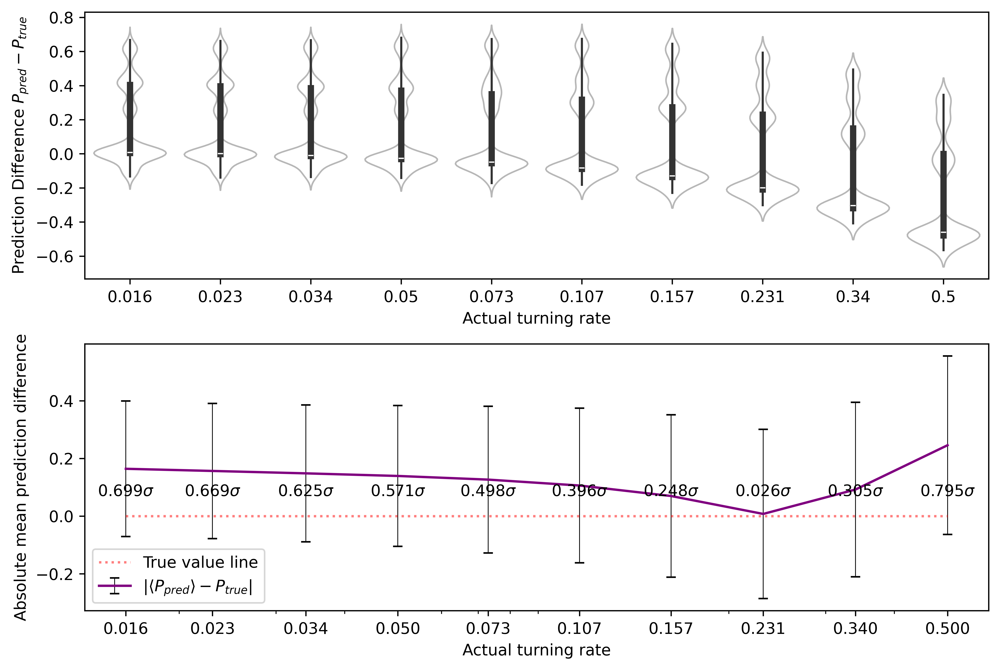

In [13]:
violin_plotter(two_pred_of_one,two_actuals_of_one,0.07,'lower left')

## Predict two on three

Prediction means and standard deviations.
Actual value 0.016: Average = 0.18592 +- 0.23755; Expected value within 0.715 stdevs of mean
Actual value 0.023: Average = 0.18527 +- 0.23711; Expected value within 0.684 stdevs of mean
Actual value 0.034: Average = 0.18743 +- 0.23925; Expected value within 0.641 stdevs of mean
Actual value 0.05: Average = 0.19378 +- 0.24587; Expected value within 0.585 stdevs of mean
Actual value 0.073: Average = 0.20346 +- 0.25603; Expected value within 0.510 stdevs of mean
Actual value 0.107: Average = 0.21630 +- 0.26914; Expected value within 0.406 stdevs of mean
Actual value 0.157: Average = 0.22934 +- 0.28279; Expected value within 0.256 stdevs of mean
Actual value 0.231: Average = 0.24056 +- 0.29453; Expected value within 0.032 stdevs of mean
Actual value 0.34: Average = 0.24856 +- 0.30292; Expected value within 0.302 stdevs of mean
Actual value 0.5: Average = 0.25451 +- 0.30930; Expected value within 0.794 stdevs of mean
With accuracy 0.005, overlap rat

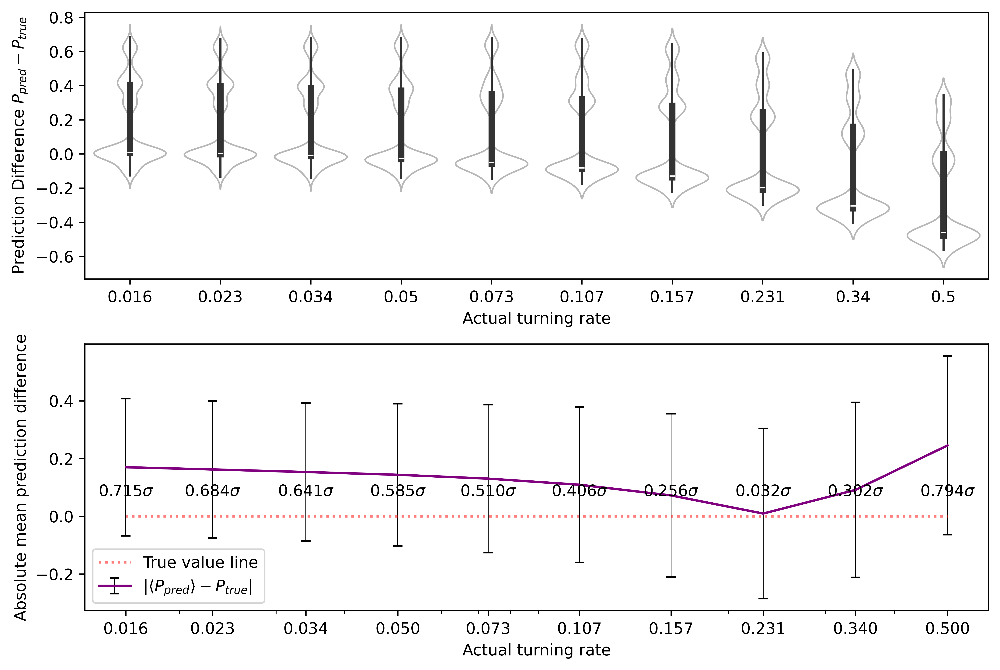

In [14]:
violin_plotter(two_pred_of_three,two_actuals_of_three,0.07,'lower left')

# Plot Scrambled Results

## Predict three on three

Prediction means and standard deviations.
Actual value 0.016: Average = 0.02384 +- 0.00516; Expected value within 1.519 stdevs of mean
Actual value 0.023: Average = 0.02754 +- 0.00571; Expected value within 0.794 stdevs of mean
Actual value 0.034: Average = 0.03396 +- 0.00876; Expected value within 0.004 stdevs of mean
Actual value 0.05: Average = 0.04881 +- 0.00979; Expected value within 0.122 stdevs of mean
Actual value 0.073: Average = 0.07388 +- 0.00935; Expected value within 0.094 stdevs of mean
Actual value 0.107: Average = 0.10586 +- 0.01111; Expected value within 0.103 stdevs of mean
Actual value 0.157: Average = 0.15874 +- 0.02497; Expected value within 0.070 stdevs of mean
Actual value 0.231: Average = 0.25025 +- 0.04177; Expected value within 0.461 stdevs of mean
Actual value 0.34: Average = 0.34369 +- 0.04586; Expected value within 0.080 stdevs of mean
Actual value 0.5: Average = 0.42774 +- 0.04429; Expected value within 1.632 stdevs of mean
With accuracy 0.005, overlap rat

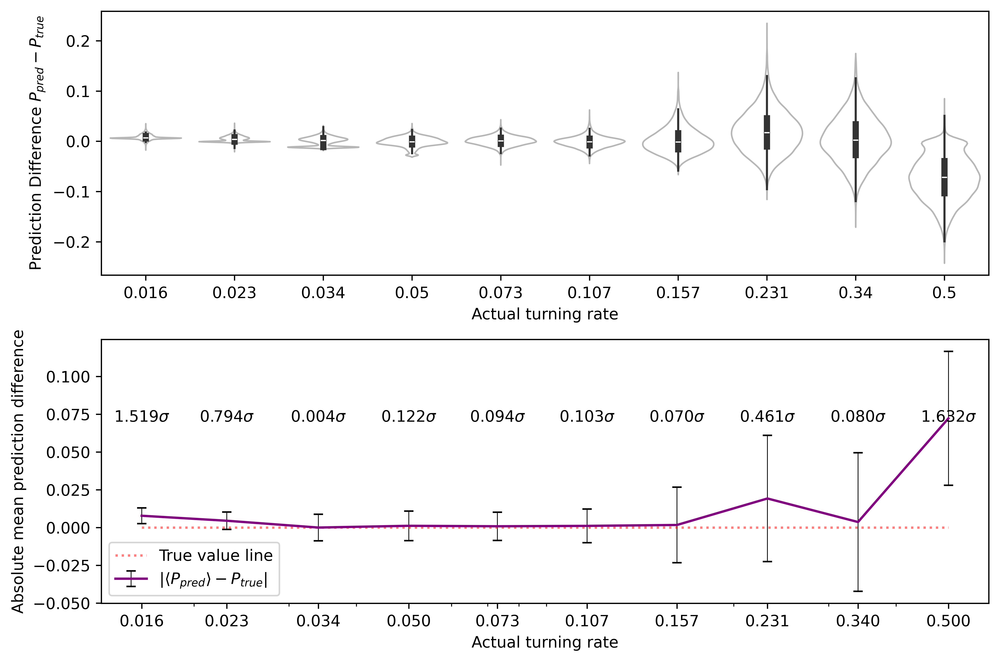

In [15]:
violin_plotter(three_pred_of_three,three_actuals_of_three,0.07,'lower left')

## Predict three on one

Prediction means and standard deviations.
Actual value 0.016: Average = 0.02110 +- 0.00533; Expected value within 0.956 stdevs of mean
Actual value 0.023: Average = 0.02528 +- 0.00529; Expected value within 0.431 stdevs of mean
Actual value 0.034: Average = 0.03168 +- 0.00781; Expected value within 0.297 stdevs of mean
Actual value 0.05: Average = 0.04454 +- 0.00996; Expected value within 0.548 stdevs of mean
Actual value 0.073: Average = 0.06965 +- 0.01017; Expected value within 0.330 stdevs of mean
Actual value 0.107: Average = 0.10205 +- 0.01315; Expected value within 0.376 stdevs of mean
Actual value 0.157: Average = 0.15467 +- 0.02632; Expected value within 0.088 stdevs of mean
Actual value 0.231: Average = 0.24644 +- 0.04115; Expected value within 0.375 stdevs of mean
Actual value 0.34: Average = 0.34208 +- 0.04514; Expected value within 0.046 stdevs of mean
Actual value 0.5: Average = 0.42605 +- 0.04390; Expected value within 1.685 stdevs of mean
With accuracy 0.005, overlap rat

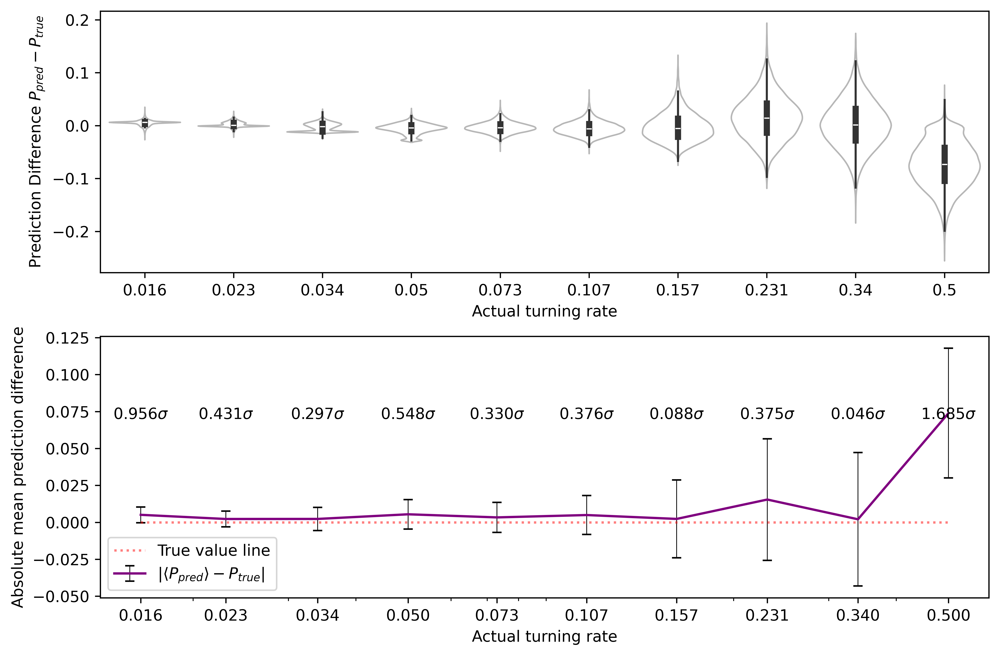

In [16]:
violin_plotter(three_pred_of_one,three_actuals_of_one,0.07,'lower left')

## Predict three on two

Prediction means and standard deviations.
Actual value 0.016: Average = 0.08016 +- 0.08455; Expected value within 0.759 stdevs of mean
Actual value 0.023: Average = 0.12334 +- 0.10635; Expected value within 0.944 stdevs of mean
Actual value 0.034: Average = 0.21303 +- 0.14725; Expected value within 1.216 stdevs of mean
Actual value 0.05: Average = 0.35540 +- 0.22140; Expected value within 1.379 stdevs of mean
Actual value 0.073: Average = 0.51578 +- 0.31674; Expected value within 1.398 stdevs of mean
Actual value 0.107: Average = 0.64173 +- 0.41015; Expected value within 1.304 stdevs of mean
Actual value 0.157: Average = 0.74630 +- 0.48528; Expected value within 1.214 stdevs of mean
Actual value 0.231: Average = 0.82865 +- 0.53899; Expected value within 1.109 stdevs of mean
Actual value 0.34: Average = 0.89274 +- 0.57645; Expected value within 0.959 stdevs of mean
Actual value 0.5: Average = 0.94804 +- 0.60427; Expected value within 0.741 stdevs of mean
With accuracy 0.005, overlap rat

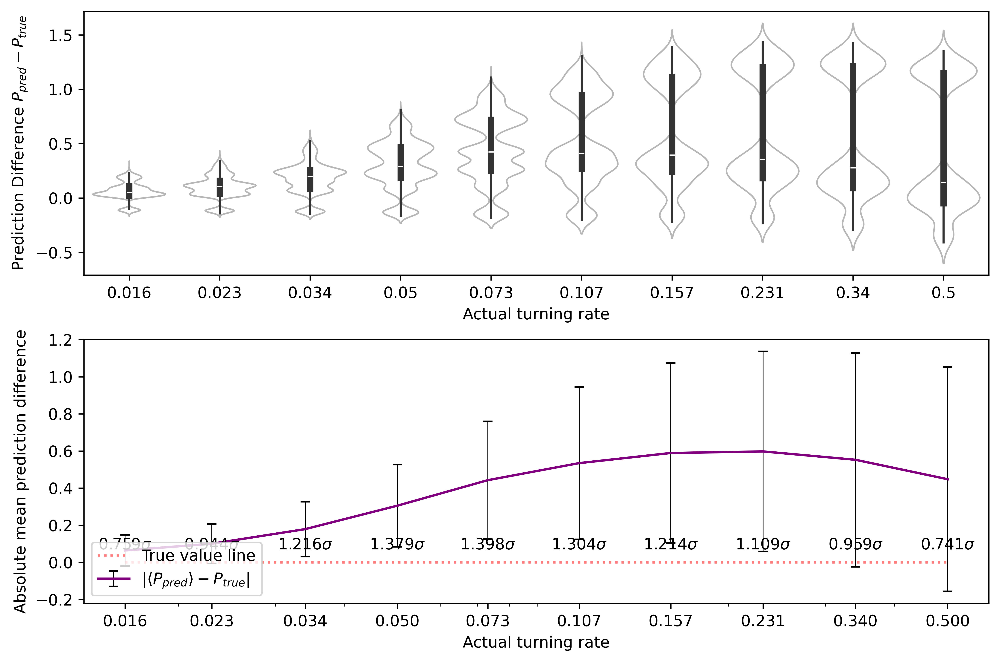

In [17]:
violin_plotter(three_pred_of_two,three_actuals_of_two,0.07,'lower left')

## Combined plots

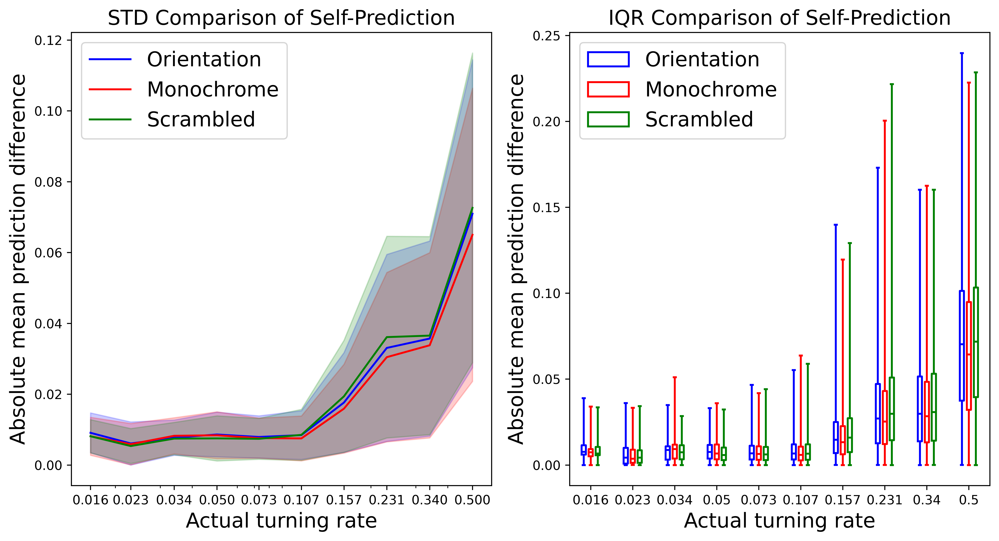

In [18]:
#predictions on own kind
#means1,std1,means2,std2,means3,std3=cross_mean_err_calculator(one_pred_of_one,one_actuals_of_one,two_pred_of_two,two_actuals_of_two,three_pred_of_three,three_actuals_of_three,three_cases=True)

fig, (ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(11,6),dpi=600)

#NOTE: I've commented out the previous method of plotting due to its inelegance, but I have kept it for posterity as a way of plotting error bands without seaborn.

#ONE ON ONE
#ax1.errorbar(np.sort(np.unique(orientation_actuals_of_orientation)),np.abs(means1-np.sort(np.unique(orientation_actuals_of_orientation))),yerr=(std1),ecolor='blue',elinewidth=0.5,capsize=3,color='blue',label="Trained Orientation Predicting Orientation")
#ax1.plot(np.sort(np.unique(one_actuals_of_one)),np.abs(means1-np.sort(np.unique(one_actuals_of_one))),'b-',label="Trained Orientation Predicting Orientation")
#ax1.fill_between(np.sort(np.unique(one_actuals_of_one)),np.abs(means1-np.sort(np.unique(one_actuals_of_one)))-std1,np.abs(means1-np.sort(np.unique(one_actuals_of_one)))+std1,color='b',alpha=0.25)

#TWO ON TWO
#ax1.errorbar(np.sort(np.unique(monochrome_actuals_of_monochrome)),np.abs(means2-np.sort(np.unique(monochrome_actuals_of_monochrome))),yerr=(std2),ecolor='red',elinewidth=0.5,capsize=3,color='red',label="Trained Monochrome Predicting Monochrome")
#ax1.plot(np.sort(np.unique(two_actuals_of_two)),np.abs(means2-np.sort(np.unique(two_actuals_of_two))),'r-',label="Trained Monochrome Predicting Monochrome")
#ax1.fill_between(np.sort(np.unique(two_actuals_of_two)),np.abs(means2-np.sort(np.unique(two_actuals_of_two)))-std2,np.abs(means2-np.sort(np.unique(two_actuals_of_two)))+std2,color='r',alpha=0.25)

#THREE ON THREE
#ax1.plot(np.sort(np.unique(three_actuals_of_three)),np.abs(means3-np.sort(np.unique(three_actuals_of_three))),'g-',label="Trained Scrambled Predicting Scrambled")
#ax1.fill_between(np.sort(np.unique(three_actuals_of_three)),np.abs(means3-np.sort(np.unique(three_actuals_of_three)))-std3,np.abs(means3-np.sort(np.unique(three_actuals_of_three)))+std3,color='g',alpha=0.25)

#ZERO LINE, LEGEND, AX1 PLOT CONFIG
#ax1.plot(np.sort(np.unique(one_actuals_of_one)),np.zeros(np.unique(one_actuals_of_one).shape[0]),color='black',label='True value line',linestyle='dotted',alpha=0.5)
#ax1.legend(loc='upper left')
#ax1.set_xscale("log")
#ax1.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
#ax1.set_xticks(np.unique(y_val1))
#ax1.set_xlabel("Actual turning rate")
#ax1.set_ylabel("Absolute mean prediction difference")

df_one = pd.DataFrame()
df_two = pd.DataFrame()
df_three = pd.DataFrame()
df_one.insert(0,"predicted",np.abs(one_pred_of_one-one_actuals_of_one))
df_one.insert(1,"actuals",one_actuals_of_one)
df_two.insert(0,"predicted",np.abs(two_pred_of_two-two_actuals_of_two))
df_two.insert(1,"actuals",np.abs(two_actuals_of_two))
df_three.insert(0,"predicted",np.abs(three_pred_of_three-three_actuals_of_three))
df_three.insert(1,"actuals",np.abs(three_actuals_of_three))
df_one['Data Type']='Orientation'
df_two['Data Type']='Monochrome'
df_three['Data Type']='Scrambled'
cdf = pd.concat([df_one,df_two,df_three])
#print(cdf.head())

sns.lineplot(ax=ax1,
             x="actuals",
             y="predicted",
             hue="Data Type",
             data=cdf,
             errorbar="sd",
             palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

sns.boxplot(ax=ax2,
            data=cdf,
            x="actuals",
            y="predicted",
            hue="Data Type",
            fill=False,
            gap=.4,
            whis=(0,100),
            width=.5,
            palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

ax1.set_xlabel("Actual turning rate",fontsize=16)
ax2.set_xlabel("Actual turning rate",fontsize=16)
ax1.set_ylabel("Absolute mean prediction difference",fontsize=16)
ax2.set_ylabel("Absolute mean prediction difference",fontsize=16)
ax2.set_title("IQR Comparison of Self-Prediction",fontsize=16)
ax1.set_title("STD Comparison of Self-Prediction",fontsize=16)

ax1.set_xscale("log")
ax1.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
ax1.set_xticks(np.unique(y_val1))

#handles,labels=ax2.get_legend_handles_labels()
#ax2.legend(handles=handles[1:],labels=labels[1:]) #this should fix hue title appearing in rightmost figure legend
ax1.legend(loc="upper left",fontsize=16)
ax2.legend(fontsize=16)


#predictions on other kind
#means1,std1,means2,std2,means3,std3=cross_mean_err_calculator(one_pred_of_two,one_actuals_of_two,two_pred_of_one,two_actuals_of_one,three_cases=False)

#ONE ON TWO
#ax2.errorbar(np.sort(np.unique(orientation_actuals_of_monochrome)),np.abs(means1-np.sort(np.unique(orientation_actuals_of_monochrome))),yerr=(std1),ecolor='blue',elinewidth=0.5,capsize=3,color='blue',label="Trained Orientation Predicting Monochrome")
#ax2.plot(np.sort(np.unique(one_actuals_of_two)),np.abs(means1-np.sort(np.unique(one_actuals_of_two))),'b-',label="Trained Orientation Predicting Monochrome")
#ax2.fill_between(np.sort(np.unique(one_actuals_of_two)),np.abs(means1-np.sort(np.unique(one_actuals_of_two)))-std1,np.abs(means1-np.sort(np.unique(one_actuals_of_two)))+std1,color='b',alpha=0.25)

#TWO ON ONE
#ax2.errorbar(np.sort(np.unique(monochrome_actuals_of_orientation)),np.abs(means2-np.sort(np.unique(monochrome_actuals_of_orientation))),yerr=(std2),ecolor='red',elinewidth=0.5,capsize=3,color='red',label="Trained Monochrome Predicting Orientation")
#ax2.plot(np.sort(np.unique(two_actuals_of_one)),np.abs(means2-np.sort(np.unique(two_actuals_of_one))),'r-',label="Trained Monochrome Predicting Orientation")
#ax2.fill_between(np.sort(np.unique(two_actuals_of_one)),np.abs(means2-np.sort(np.unique(two_actuals_of_one)))-std2,np.abs(means2-np.sort(np.unique(two_actuals_of_one)))+std2,color='r',alpha=0.25)

#ZERO LINE, LEGEND, AX2 PLOT CONFIG
#ax2.plot(np.sort(np.unique(one_actuals_of_two)),np.zeros(np.unique(one_actuals_of_two).shape[0]),color='black',label='True value line',linestyle='dotted',alpha=0.5)
#ax2.legend(loc='upper left')
#ax2.set_xscale("log")
#ax2.get_xaxis().set_major_formatter(ticker.ScalarFormatter())
#ax2.set_xticks(np.unique(y_val1))
#ax2.set_xlabel("Actual turning rate")
#ax2.set_ylabel("Absolute mean prediction difference")

fig.tight_layout()

In [19]:
df12=pd.DataFrame()
df21=pd.DataFrame()
df13=pd.DataFrame()
df31=pd.DataFrame()
df23=pd.DataFrame()
df32=pd.DataFrame()
df12.insert(0,"predicted",np.abs(one_pred_of_two-one_actuals_of_two))
df12.insert(1,"actuals",one_actuals_of_two)
df21.insert(0,"predicted",np.abs(two_pred_of_one-two_actuals_of_one))
df21.insert(1,"actuals",two_actuals_of_one)
df13.insert(0,"predicted",np.abs(one_pred_of_three-one_actuals_of_three))
df13.insert(1,"actuals",one_actuals_of_three)
df31.insert(0,"predicted",np.abs(three_pred_of_one-three_actuals_of_one))
df31.insert(1,"actuals",three_actuals_of_one)
df23.insert(0,"predicted",np.abs(two_pred_of_three-two_actuals_of_three))
df23.insert(1,"actuals",two_actuals_of_three)
df32.insert(0,"predicted",np.abs(three_pred_of_two-three_actuals_of_two))
df32.insert(1,"actuals",three_actuals_of_two)

fig,ax = plt.subplots(nrows=3,ncols=2,figsize=(12,16),dpi=600)

#PREDICTING ONE

df21['Data Type']='Monochrome'
df31['Data Type']='Scrambled'
cdf = pd.concat([df_one,df21,df31])

sns.lineplot(ax=ax[0][0],
             x="actuals",
             y="predicted",
             hue="Data Type",
             data=cdf,
             errorbar="sd",
             palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

sns.boxplot(ax=ax[0][1],
            data=cdf,
            x="actuals",
            y="predicted",
            hue="Data Type",
            fill=False,
            gap=.4,
            whis=(0,100),
            width=.5,
            palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})



#PREDICTING TWO

df12['Data Type']='Orientation'
df32['Data Type']='Scrambled'
cdf = pd.concat([df12,df_two,df32])

sns.lineplot(ax=ax[1][0],
             x="actuals",
             y="predicted",
             hue="Data Type",
             data=cdf,
             errorbar="sd",
             palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

ax[0][0].legend(loc='upper left',fontsize=16)
ax[0][1].legend(loc='upper right',fontsize=16)

sns.boxplot(ax=ax[1][1],
            data=cdf,
            x="actuals",
            y="predicted",
            hue="Data Type",
            fill=False,
            gap=.4,
            whis=(0,100),
            width=.5,
            palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

ax[1][0].legend(loc='upper left',fontsize=16)
ax[1][1].legend(loc='upper left',fontsize=16)

#PREDICTING THREE

df13['Data Type']='Orientation'
df23['Data Type']='Monochrome'
cdf = pd.concat([df13,df23,df_three])

sns.lineplot(ax=ax[2][0],
             x="actuals",
             y="predicted",
             hue="Data Type",
             data=cdf,
             errorbar="sd",
             palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

sns.boxplot(ax=ax[2][1],
            data=cdf,
            x="actuals",
            y="predicted",
            hue="Data Type",
            fill=False,
            gap=.4,
            whis=(0,100),
            width=.5,
            palette={"Orientation": "blue", "Monochrome": "red", "Scrambled": "green"})

ax[2][1].legend(fontsize=16)
ax[2][0].legend(loc='upper left',fontsize=16)

for i,examiner in enumerate(["STD","IQR"]):
    for j,examined in enumerate(["Orientation","Monochrome","Scrambled"]):
        ax[j][i].set_xlabel("Actual turning rate",fontsize=16)
        ax[j][i].set_ylabel("Absolute mean prediction difference",fontsize=16)
        ax[j][i].set_title(f"{examiner} Comparison Predicting on {examined}",fontsize=16)
        if i == 0:
            ax[j][i].set_xscale("log")
            ax[j][i].get_xaxis().set_major_formatter(ticker.ScalarFormatter())
            ax[j][i].set_xticks(np.unique(y_val1))



fig.tight_layout()
